# Root Cause Discovery + Lasso

Here for a known "root cause gene", lets run a Lasso regression to filter down the number of features, before running Root Cause Discovery algorithm

+ After processing, we obtained 2 datasets
    1. "Interventional data": there are 32 samples for which we have ground truth data. Each row is a gene and each column is a sample. 
    2. "observational data": these are a few hundred samples for which we did not do any intervention. Each row is a gene and each column is a sample.
+ The main idea is that an intervention supposedly caused a disturbance in gene expression, so we can compare the data of intervention to baseline (i.e. observational data), and try to which gene is most differentially expressed

In [1]:
# using Pkg
# Pkg.update("RootCauseDiscovery")

using RootCauseDiscovery
using DataFrames
using CSV
using DelimitedFiles
using JLD2
using Random
using ProgressMeter
using LinearAlgebra
BLAS.set_num_threads(1)

using Plots
gr(fmt=:png)

# import RootCauseDiscovery.zscore
# import RootCauseDiscovery.compute_permutations
# import RootCauseDiscovery.root_cause_discovery
# import RootCauseDiscovery.find_largest
# import RootCauseDiscovery.find_second_largest

# using Statistics
# import StatsBase.cov2cor
# using GLMNet
# using CovarianceEstimation
# using LinearAlgebra
# using Plots
# gr(fmt=:png)
# include("/home/users/bbchu/RootCauseDiscovery/utilities.jl")

# helper function to submit 1 job to run 1 command
function submit(command::String, ncores::Int, total_mem::Number, joblog_dir::String; 
        jobname="submit", waitfor=Int[], verbose=true)
    mem = round(Int, total_mem / ncores) # memory per core
    filename = "$jobname.sh"
    open(filename, "w") do io
        println(io, "#!/bin/bash")
        println(io, "#")
        println(io, "#SBATCH --job-name=$jobname")
        println(io, "#")
        println(io, "#SBATCH --time=168:00:00")
        println(io, "#SBATCH --cpus-per-task=$ncores")
        println(io, "#SBATCH --mem-per-cpu=$(mem)G")
        println(io, "#SBATCH --partition=candes,zihuai")
        println(io, "#SBATCH --output=$(joinpath(joblog_dir, "slurm-%j.out"))")
        println(io, "")
        println(io, "#save job info on joblog:")
        println(io, "echo \"Job \$JOB_ID started on:   \" `hostname -s`")
        println(io, "echo \"Job \$JOB_ID started on:   \" `date `")
        println(io, "")
        println(io, "# load the job environment:")
        println(io, "module load julia/1.10")
        println(io, "export JULIA_DEPOT_PATH=\"/home/groups/sabatti/.julia\"")
        println(io, "")
        println(io, "# run code")
        println(io, "echo \"$command\"")
        println(io, "$command")
        println(io, "")
        println(io, "#echo job info on joblog:")
        println(io, "echo \"Job \$JOB_ID ended on:   \" `hostname -s`")
        println(io, "echo \"Job \$JOB_ID ended on:   \" `date `")
        println(io, "#echo \" \"")
    end
    # submit job and capture job ID
    io = IOBuffer()
    if length(waitfor) != 0
        run(pipeline(`sbatch --dependency=afterok:$(join(waitfor, ':')) $filename`; stdout=io))
    else
        run(pipeline(`sbatch $filename`; stdout=io))
    end
    msg = String(take!(io))
    verbose && println(stdout, msg)
    jobid = parse(Int, strip(msg)[21:end])
    # clean up and return job ID
    close(io)
    rm(filename, force=true)
    return jobid
end

# helper function to submit 1 job to run multiple commands
function submit(commands::Vector{String}, ncores::Int, 
        total_mem::Number, joblog_dir::String; 
        jobname="submit", waitfor=Int[], verbose=true)
    mem = round(Int, total_mem / ncores) # memory per core
    filename = "$jobname.sh"
    open(filename, "w") do io
        println(io, "#!/bin/bash")
        println(io, "#")
        println(io, "#SBATCH --job-name=$jobname")
        println(io, "#")
        println(io, "#SBATCH --time=168:00:00")
        println(io, "#SBATCH --cpus-per-task=$ncores")
        println(io, "#SBATCH --mem-per-cpu=$(mem)G")
        println(io, "#SBATCH --partition=candes,zihuai")
        println(io, "#SBATCH --output=$(joinpath(joblog_dir, "slurm-%j.out"))")
        println(io, "")
        println(io, "#save job info on joblog:")
        println(io, "echo \"Job \$JOB_ID started on:   \" `hostname -s`")
        println(io, "echo \"Job \$JOB_ID started on:   \" `date `")
        println(io, "")
        println(io, "# load the job environment:")
        println(io, "module load julia/1.10")
        println(io, "export JULIA_DEPOT_PATH=\"/home/groups/sabatti/.julia\"")
        println(io, "")
        for command in commands
            println(io, "echo \"$command\"")
            println(io, "$command")
        end
        println(io, "")
        println(io, "#echo job info on joblog:")
        println(io, "echo \"Job \$JOB_ID ended on:   \" `hostname -s`")
        println(io, "echo \"Job \$JOB_ID ended on:   \" `date `")
        println(io, "#echo \" \"")
    end
    # submit job and capture job ID
    io = IOBuffer()
    if length(waitfor) != 0
        run(pipeline(`sbatch --dependency=afterok:$(join(waitfor, ':')) $filename`; stdout=io))
    else
        run(pipeline(`sbatch $filename`; stdout=io))
    end
    msg = String(take!(io))
    verbose && println(stdout, msg)
    jobid = parse(Int, strip(msg)[21:end])
    # clean up and return job ID
    close(io)
    rm(filename, force=true)
    return jobid
end

function make_plot(
        Z_score_rank::AbstractVector, 
        RCD_rank::AbstractVector, 
        patient_name::AbstractVector;
        plot1_ymax = 5500,
        plot2_ymin = -2500,
        plot2_ymax = 2500,
        title1 = "Root cause rank (Z-score vs Cholesky score)",
        title2 = "Original Z score rank - refined Z score rank"
    )
    # sort by diff in Z scores
    Z_score_diff = Z_score_rank - RCD_rank
    perm = sortperm(Z_score_diff)

    #
    # plot 1
    #
    plt1 = scatter(
        1:length(patient_name), 
        Z_score_rank[perm], 
        ylabel="rank", 
        xticks=(1:length(patient_name), patient_name[perm]),
        xrotation = 50,
        label = "Original z-score rank",
        title = title1,
        legend=:top,
        dpi=300,
        ylim=(0, plot1_ymax)
    )
    scatter!(plt1, 1:length(patient_name), RCD_rank[perm], label="Refined Z-score rank")

    #
    # plot 2
    #
    palettes = theme_palette(:auto)
    my_colors = []
    for i in eachindex(Z_score_diff)
        if isinf(Z_score_diff[i])
            push!(my_colors, :black)
            Z_score_diff[i] = plot2_ymin
        elseif Z_score_diff[i] > 0
            push!(my_colors, palettes[1])
        elseif Z_score_diff[i] == 0
            push!(my_colors, palettes[3])
        else
            push!(my_colors, palettes[2])
        end
    end

    # make plot
    plt2 = scatter(
        1:length(patient_name_success), 
        Z_score_diff[perm],
        title=title2, 
        ylabel="Rank difference",
        xticks=(1:length(patient_name), patient_name[perm]),
        xrotation = 50,
        ylim=(plot2_ymin, plot2_ymax),
        label = nothing,
        legend=:outerbottom,
        color=my_colors[perm],
        dpi=300,
    )
    hline!(plt2, [0], color=:black, linestyle=:dash, label=nothing)

    #
    # combine plots
    #
    return plot(plt1, plt2, layout = (2, 1), size=(800, 600))
end

make_plot (generic function with 1 method)

## Read processed data
First, read in data and log (base 2) transform them

In [2]:
low_count = 10
threshold = 0.1
dir = "/scratch/users/bbchu/RootCauseDiscovery/6.18.2024/data"

# this example succeeded for all patients
# low_count = 5
# threshold = 0.1
# dir = "/scratch/users/bbchu/RootCauseDiscovery/result_3.31.2024/data"

# read processed data
isdir(dir) || mkpath(dir)
trainsform_int_file = joinpath(dir, "transform_int")
transform_obs_file = joinpath(dir, "transform_obs")
ground_truth_file = joinpath(dir, "ground_truth")

if !(isfile(trainsform_int_file) && isfile(transform_obs_file) && isfile(ground_truth_file))
    # process raw data & save
    transform_int, transform_obs, ground_truth = QC_gene_expression_data(;
        low_count = low_count, threshold = threshold)
    CSV.write(trainsform_int_file, transform_int)
    CSV.write(transform_obs_file, transform_obs)
    CSV.write(ground_truth_file, ground_truth)
else
    transform_int = CSV.read(trainsform_int_file, DataFrame)
    transform_obs = CSV.read(transform_obs_file, DataFrame)
    ground_truth = CSV.read(ground_truth_file, DataFrame)
end

# numeric matrices
Xobs = transform_obs[:, 2:end] |> Matrix |> transpose
Xint = transform_int[:, 2:end] |> Matrix |> transpose

32×19831 transpose(::Matrix{Float64}) with eltype Float64:
 7.16274  7.52424  6.15763  5.75892  6.71093  …  4.24341   0.876118   5.86428
 7.28331  7.48512  5.7278   6.7784   6.82328     3.83068  -0.0405209  6.12909
 7.12219  7.70444  6.29776  5.83877  8.26801     4.5623   -0.357678   6.02414
 7.32946  7.57693  5.63379  5.6664   7.6331      4.19649   0.435292   5.80593
 7.31514  7.64971  5.95742  5.71711  7.53973     4.38032  -0.0970216  6.23092
 7.95809  7.62406  6.30906  5.60937  7.64697  …  4.8307    0.582208   5.77794
 6.8262   7.12514  5.88471  5.75877  6.6719      4.58078   0.511751   5.41703
 7.39306  6.96359  5.92104  5.2092   7.54883     4.37441   1.74974    5.50628
 6.96896  7.23953  5.89655  6.67371  6.15803     4.18748   0.0443435  5.95514
 6.67892  7.15655  5.75922  6.28361  5.655       4.20619   0.0790509  5.74201
 7.24626  7.49005  5.87219  6.38005  7.67899  …  4.179    -0.286904   6.37751
 7.24139  7.43208  6.1709   6.44001  7.89138     4.40598   0.426295   5.87733
 6.96

## Test run Root Cause Discovery

In [5]:
# parameters for current run
patient_id = "R19100" # "R62943"
method = "cv"

# compute default y indices
# i = findfirst(x -> x == patient_id, ground_truth[!, "Patient ID"])
# Xint_sample = Xint[i, :]
# y_idx_z_threshold = 1.5
# y_indices = RootCauseDiscovery.compute_y_idx(Xobs, Xint_sample, y_idx_z_threshold)

# compute smaller set of y indices to quickly test our code
i = findfirst(x -> x == patient_id, ground_truth[!, "Patient ID"])
Xint_sample = Xint[i, :]
patient_root_cause_idx = ground_truth[i, "root cause row index in genecounts"]
jld2_file = "/scratch/users/bbchu/RootCauseDiscovery/6.11.2024/cv/$(patient_id).jld2"
cholesky_score = JLD2.load(jld2_file)["root_cause_score"]
root_cause_cholesky_score = cholesky_score[patient_root_cause_idx]
y_indices = findall(x -> x >= root_cause_cholesky_score, cholesky_score)

13-element Vector{Int64}:
  7651
 11658
 11659
 12470
 13081
 13082
 13563
 15294
 15588
 16016
 18290
 18291
 18741

In [4]:
n, p = size(Xobs)
root_cause_scores = zeros(p)
for y_idx in y_indices
    # run lasso, select gene subset to run root cause discovery
    Xobs_new, Xint_sample_new, _ = reduce_genes(
        patient_id, y_idx, Xobs, Xint, ground_truth, method
    )

    # compute current guess of root cause index
    root_cause_scores[y_idx] = root_cause_discovery_reduced_dimensional(
        Xobs_new, Xint_sample_new, nshuffles=1
    )
end

Lasso found 142 non-zero entries
Lasso found 190 non-zero entries
Lasso found 174 non-zero entries
Lasso found 202 non-zero entries
Lasso found 191 non-zero entries
Lasso found 190 non-zero entries
Lasso found 201 non-zero entries
Lasso found 157 non-zero entries
Lasso found 203 non-zero entries
Lasso found 198 non-zero entries
Lasso found 205 non-zero entries
Lasso found 201 non-zero entries
Lasso found 137 non-zero entries


### `method=cv`

In [6]:
# parameters for current run
patient_id = "R19100" # "R62943"
method = "cv"

# compute default y indices
# i = findfirst(x -> x == patient_id, ground_truth[!, "Patient ID"])
# Xint_sample = Xint[i, :]
# y_idx_z_threshold = 1.5
# y_indices = RootCauseDiscovery.compute_y_idx(Xobs, Xint_sample, y_idx_z_threshold)

# compute smaller set of y indices to quickly test our code
i = findfirst(x -> x == patient_id, ground_truth[!, "Patient ID"])
Xint_sample = Xint[i, :]
patient_root_cause_idx = ground_truth[i, "root cause row index in genecounts"]
jld2_file = "/scratch/users/bbchu/RootCauseDiscovery/6.11.2024/cv/$(patient_id).jld2"
cholesky_score = JLD2.load(jld2_file)["root_cause_score"]
root_cause_cholesky_score = cholesky_score[patient_root_cause_idx]
y_indices = findall(x -> x >= root_cause_cholesky_score, cholesky_score)

# run main alg
Random.seed!(2024)
@time results = root_cause_discovery_high_dimensional(
    Xobs, Xint_sample, 
    method, 
    nshuffles=1,
    y_indices = y_indices
);


# save result in jld2 format
# outfile = "/scratch/users/bbchu/RootCauseDiscovery/result_3.18.2024/$(patient_id).jld2"
# save(outfile, Dict("results"=>results, "y_indices"=>y_indices))

results

Trying 13 y_idx
Lasso found 146 non-zero entries
Lasso found 190 non-zero entries
Lasso found 174 non-zero entries
Lasso found 202 non-zero entries
Lasso found 191 non-zero entries
Lasso found 190 non-zero entries
Lasso found 201 non-zero entries
Lasso found 157 non-zero entries
Lasso found 203 non-zero entries
Lasso found 198 non-zero entries
Lasso found 205 non-zero entries
Lasso found 201 non-zero entries
Lasso found 137 non-zero entries
190.869908 seconds (13.94 M allocations: 40.418 GiB, 1.56% gc time, 4.83% compilation time)


19831-element Vector{Float64}:
 0.008686137552681997
 0.03171168660432332
 0.00014801042262494905
 0.0007269696039966883
 0.007934808116418897
 0.015899605569319686
 0.01114685213030734
 0.0030498968734769326
 6.130969000341108e-6
 9.338286185941123e-5
 0.0025723893590032815
 0.004502891827771106
 0.00047619602511935936
 ⋮
 0.0003396082125272057
 0.0022561808301085223
 0.0002256412215741851
 0.025700911277159736
 0.0219300548333717
 0.002521567153939639
 0.003046119756683315
 0.029132174536603758
 2.6543924434369545e-5
 0.0054697960037021235
 0.016209051473156016
 0.0218205915104205

In [7]:
results[y_indices]

13-element Vector{Float64}:
 5.5952478773566225
 0.02350420478085481
 0.023466312564312593
 0.18926880477238778
 0.02266639654893104
 0.022686120235520985
 0.021058596101561213
 0.5148813912855643
 0.022060137979859232
 0.021972963037761924
 0.02393063472883234
 0.02396061822659581
 0.7275319240308511

### `method=nhalf`

In [13]:
# parameters for current run
patient_id = "R63087" # "R62943"
method = "cv"

# compute default y indices
i = findfirst(x -> x == patient_id, ground_truth[!, "Patient ID"])
Xint_sample = Xint[i, :]
y_idx_z_threshold = 1.5
y_indices = RootCauseDiscovery.compute_y_idx(Xobs, Xint_sample, y_idx_z_threshold)

# # compute smaller set of y indices to quickly test our code
# i = findfirst(x -> x == patient_id, ground_truth[!, "Patient ID"])
# Xint_sample = Xint[i, :]
# patient_root_cause_idx = ground_truth[i, "root cause row index in genecounts"]
jld2_file = "/scratch/users/bbchu/RootCauseDiscovery/6.13.2024/cv/$(patient_id).jld2"
cholesky_score = JLD2.load(jld2_file)["root_cause_score"]
# root_cause_cholesky_score = cholesky_score[patient_root_cause_idx]
# y_indices = findall(x -> x >= root_cause_cholesky_score, cholesky_score)

# root cause y_idx
i = findfirst(x -> x == patient_id, ground_truth[!, "Patient ID"])
y_idx = ground_truth[i, "root cause row index in genecounts"]

# run main alg
# Random.seed!(2024)
# @time results = root_cause_discovery_high_dimensional(
#     Xobs, Xint_sample, method, 
#     nshuffles=1,
#     y_indices = y_indices
# );


# save result in jld2 format
# outfile = "/scratch/users/bbchu/RootCauseDiscovery/result_3.18.2024/$(patient_id).jld2"
# save(outfile, Dict("results"=>results, "y_indices"=>y_indices))

11516

In [19]:
i = findfirst(x -> x == patient_id, ground_truth[!, "Patient ID"])
Xint_sample = Xint[i, :]
y_idx_z_threshold = 1.5
y_indices = RootCauseDiscovery.compute_y_idx(Xobs, Xint_sample, y_idx_z_threshold)
y_idx in y_indices

false

In [10]:
results[y_indices]

13-element Vector{Float64}:
 6.394449840292501
 0.01667722108713548
 0.01665033496702854
 0.13429707583619566
 0.01608276093659272
 0.016096755721142157
 0.014941958949255424
 0.4913414147099184
 0.01565259500302255
 0.01559074071796291
 0.016979791056504948
 0.01700106560826406
 0.6484721523570206

In [11]:
sort(results)

19831-element Vector{Float64}:
 3.07756093070007e-10
 5.127444711791303e-10
 6.174570241410729e-10
 8.96107332533128e-10
 9.569134521387336e-10
 1.1565519221047662e-9
 1.8849048055658997e-9
 1.920421298317373e-9
 2.3038253191280343e-9
 2.5413235409225025e-9
 4.682352434251474e-9
 5.510380251975032e-9
 6.735249747118503e-9
 ⋮
 0.09525678141177063
 0.09928237780571587
 0.09930119003970235
 0.09970960812594808
 0.10443156219165797
 0.10503675598590702
 0.11414891449663107
 0.13428707583619565
 0.13429707583619566
 0.4913414147099184
 0.6484721523570206
 6.394449840292501

## Submit main jobs (1 job for each patient)

In [ ]:
# put this in script /scratch/users/bbchu/RootCauseDiscovery/run_realData_RCD.jl

using RootCauseDiscovery
using DataFrames
using CSV
using DelimitedFiles
using JLD2
using Random
using LinearAlgebra
BLAS.set_num_threads(1)

# inputs to the script
patient_id = ARGS[1]
y_idx_z_threshold = parse(Float64, ARGS[2])
outfile = ARGS[3]
low_count = parse(Int, ARGS[4]) # min number of gene count exceeding `threshold` is needed to prevent gene from being filtered out
threshold = parse(Float64, ARGS[5]) # for processing raw data
seed = parse(Int, ARGS[6])
nshuffles = parse(Int, ARGS[7])
method = ARGS[8] # "cv" or "nhalf"

# process raw data
transform_int, transform_obs, ground_truth = 
    QC_gene_expression_data(low_count = low_count, threshold = threshold);

# numeric matrices
Xobs = transform_obs[:, 2:end] |> Matrix |> transpose
Xint = transform_int[:, 2:end] |> Matrix |> transpose
i = findfirst(x -> x == patient_id, ground_truth[!, "Patient ID"])
Xint_sample = Xint[i, :]

# run main alg
Random.seed!(seed)
@time root_cause_score = root_cause_discovery_high_dimensional(
    Xobs, Xint_sample, method, y_idx_z_threshold=y_idx_z_threshold,
    nshuffles=nshuffles
);

# save result
save(outfile, Dict("root_cause_score"=>root_cause_score))

# to load later, do:
# using JLD2
# root_cause_score = load("R58859.jld2", "root_cause_score")


### Submit jobs for each patient

20 runs take ~300 sec, so if a patient requires 4000 tries, it'll take ~16.6h

In [7]:
julia_exe = "/scratch/users/bbchu/RootCauseDiscovery/run_realData_RCD.jl"
dirs = [
    "/scratch/users/bbchu/RootCauseDiscovery/6.17.2024",
    "/scratch/users/bbchu/RootCauseDiscovery/6.18.2024"
]
joblog_dirs = [joinpath(dirs[i], "joblogs") for i in eachindex(dirs)]
seeds = [6172024, 6182024]
low_counts = [10, 10]
thresholds = [0.1, 0.1]
nshuffles = 20
y_idx_z_threshold = 1.5
method = "cv"

# patient IDs
patient_name = ["R62943", "R98254", "R86287", "R89912", "R19100", "R15264", "R36605", "R61100", "R77611", 
    "R16472", "R51757", "R80346", "R20754", "R25473", "R28774", "R96820", "R21147", "R64921", "R52016", 
    "R46723", "R58859", "R80184", "R59185", "R63087", "R44456", "R33391", "R66696", "R24289", "R98349", 
    "R91273", "R60537", "R70961"]

# for testing
# nshuffles = 2
# y_idx_z_threshold = 20
# patient_name = ["R62943", "R98254"]

for (dir, joblog_dir, seed, low_count, threshold) in zip(dirs, joblog_dirs, seeds, low_counts, thresholds)
    for patient in patient_name
        outdir = joinpath(dir, method)
        isdir(outdir) || mkpath(outdir)

        outfile = joinpath(outdir, "$(patient).jld2")
        if !isfile(outfile)
            cmd = "julia -t 36 $julia_exe $patient $y_idx_z_threshold $outfile $low_count $threshold $seed $nshuffles $method"
            submit(cmd, 36, 72, joblog_dir, jobname=patient)
        end
    end
end

Submitted batch job 48885357

Submitted batch job 48885361



# Plot result

### 6.18.2024

+ low_count = 10
+ threshold = 0.1

Progress: 100%|█████████████████████████████████████████| Time: 0:00:06


df = 32×3 DataFrame
 Row │ Patient Name  Original Z-score rank  Cholesky score rank
     │ String        Float64                Float64
─────┼──────────────────────────────────────────────────────────
   1 │ R62943                        739.0                  4.0
   2 │ R98254                       2111.0                 14.0
   3 │ R86287                      14630.0              14630.0
   4 │ R89912                         58.0                 13.0
   5 │ R19100                          0.0                  0.0
   6 │ R15264                          0.0                  0.0
   7 │ R36605                        286.0                  7.0
   8 │ R61100                          1.0                  2.0
   9 │ R77611                          5.0                  0.0
  10 │ R16472                          0.0                  0.0
  11 │ R51757                         24.0                 18.0
  12 │ R80346                       1661.0                 57.0
  13 │ R20754                  

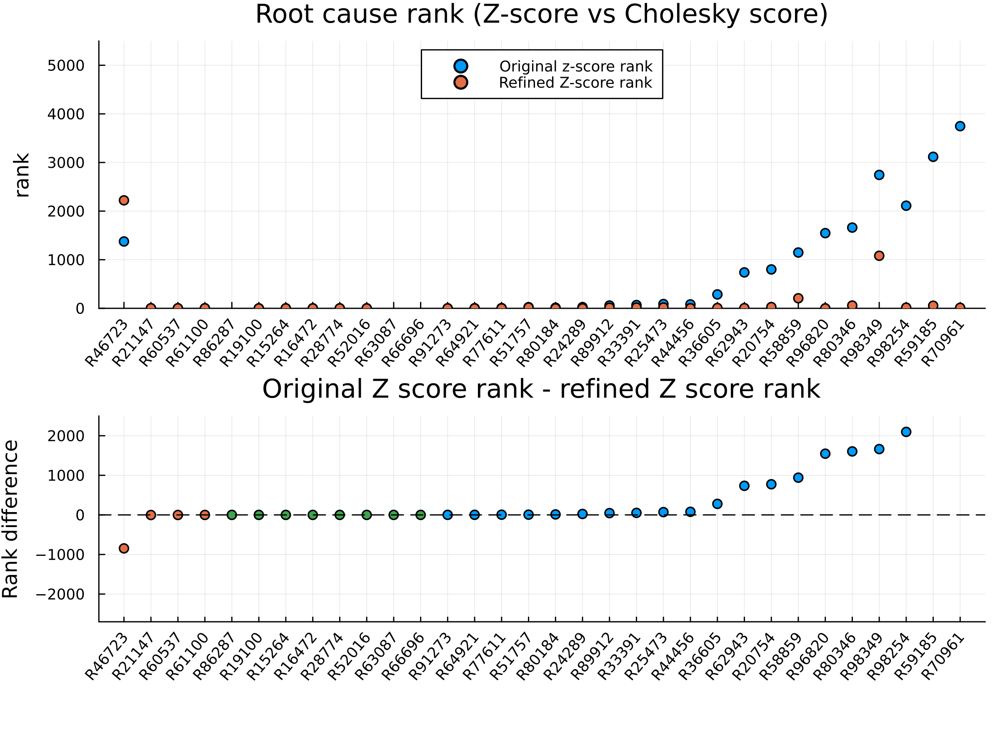

In [3]:
cv_outdir = "/scratch/users/bbchu/RootCauseDiscovery/6.18.2024/cv"

# run z score method
z = RootCauseDiscovery.zscore(Xobs, Xint) # each row is a patient, each col a gene, df_z[i, j] is a z score
df = DataFrame(
    "Patient Name"=>String[],
    "Original Z-score rank"=>Float64[],
    "Cholesky score rank"=>Float64[],
)

# compare our method against z score method
patient_name = ground_truth[!, "Patient ID"]
@showprogress for (i, id) in enumerate(patient_name)
    try
        patient_root_cause_idx = ground_truth[i, "root cause row index in genecounts"]
        patient_root_cause_zscore = z[i, patient_root_cause_idx]
        root_cause_zscore_rank = 
            count(x -> x > patient_root_cause_zscore, @view(z[i, :]))

        # cv result
        jld2_file = joinpath(cv_outdir, "$id.jld2")
        cholesky_score = JLD2.load(jld2_file)["root_cause_score"]
        root_cause_cholesky_score = cholesky_score[patient_root_cause_idx]
        root_cause_chol_rank_cv = count(x -> x > root_cause_cholesky_score, cholesky_score)

        push!(df, [id, root_cause_zscore_rank, root_cause_chol_rank_cv])
    catch e
        println(e)
        continue
    end
end

# @show length(cholesky_score)
@show df;

# only plot completed patients
patient_name_success = df[!, "Patient Name"]
Z_score_rank = df[!, "Original Z-score rank"]
RCD_rank = df[!, "Cholesky score rank"]

# make plot
plt = make_plot(Z_score_rank, RCD_rank, patient_name_success;
    plot1_ymax = 5500, plot2_ymin = -2700, plot2_ymax = 2500
)
plot(plt)

### 6.17.2024

+ low_count = 10
+ threshold = 0.1

Progress: 100%|█████████████████████████████████████████| Time: 0:00:00


df = 32×3 DataFrame
 Row │ Patient Name  Original Z-score rank  Cholesky score rank
     │ String        Float64                Float64
─────┼──────────────────────────────────────────────────────────
   1 │ R62943                        739.0                  3.0
   2 │ R98254                       2111.0                 14.0
   3 │ R86287                      14630.0              14630.0
   4 │ R89912                         58.0                  6.0
   5 │ R19100                          0.0                  0.0
   6 │ R15264                          0.0                  0.0
   7 │ R36605                        286.0                  0.0
   8 │ R61100                          1.0                  2.0
   9 │ R77611                          5.0                  2.0
  10 │ R16472                          0.0                  0.0
  11 │ R51757                         24.0                 26.0
  12 │ R80346                       1661.0                203.0
  13 │ R20754                  

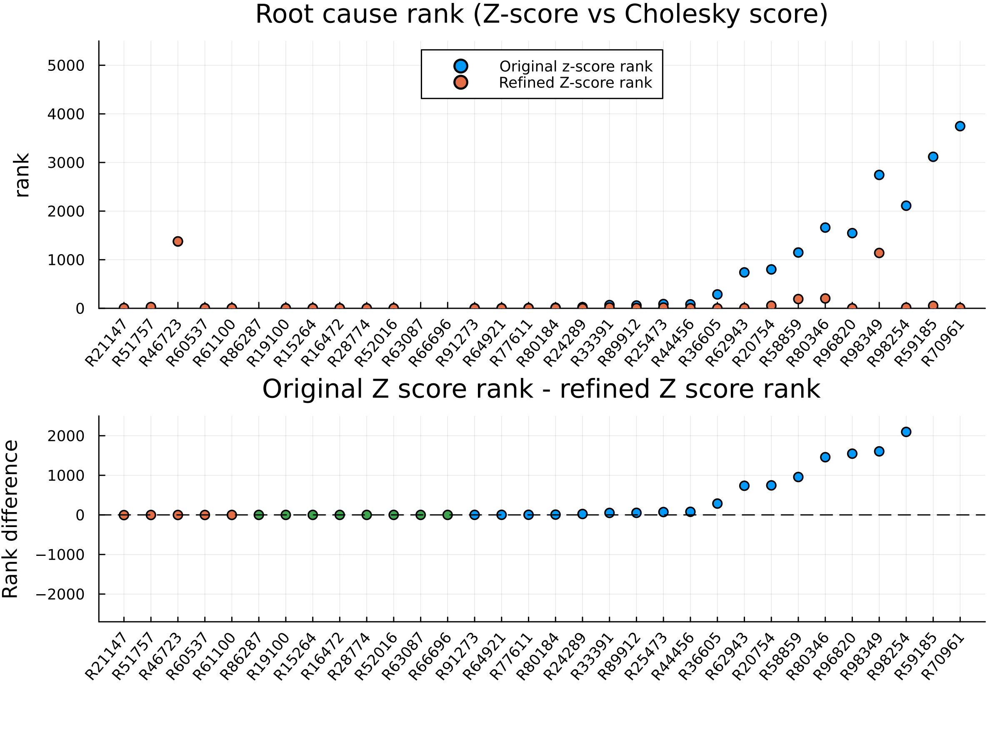

In [4]:
cv_outdir = "/scratch/users/bbchu/RootCauseDiscovery/6.17.2024/cv"

# run z score method
z = RootCauseDiscovery.zscore(Xobs, Xint) # each row is a patient, each col a gene, df_z[i, j] is a z score
df = DataFrame(
    "Patient Name"=>String[],
    "Original Z-score rank"=>Float64[],
    "Cholesky score rank"=>Float64[],
)

# compare our method against z score method
patient_name = ground_truth[!, "Patient ID"]
@showprogress for (i, id) in enumerate(patient_name)
    try
        patient_root_cause_idx = ground_truth[i, "root cause row index in genecounts"]
        patient_root_cause_zscore = z[i, patient_root_cause_idx]
        root_cause_zscore_rank = 
            count(x -> x > patient_root_cause_zscore, @view(z[i, :]))

        # cv result
        jld2_file = joinpath(cv_outdir, "$id.jld2")
        cholesky_score = JLD2.load(jld2_file)["root_cause_score"]
        root_cause_cholesky_score = cholesky_score[patient_root_cause_idx]
        root_cause_chol_rank_cv = count(x -> x > root_cause_cholesky_score, cholesky_score)

        push!(df, [id, root_cause_zscore_rank, root_cause_chol_rank_cv])
    catch e
        println(e)
        continue
    end
end

# @show length(cholesky_score)
@show df;

# only plot completed patients
patient_name_success = df[!, "Patient Name"]
Z_score_rank = df[!, "Original Z-score rank"]
RCD_rank = df[!, "Cholesky score rank"]

# make plot
plt = make_plot(Z_score_rank, RCD_rank, patient_name_success;
    plot1_ymax = 5500, plot2_ymin = -2700, plot2_ymax = 2500
)
plot(plt)

In [5]:
CSV.write("/scratch/users/bbchu/RootCauseDiscovery/6.17.2024/cv_result.csv", df)

"/scratch/users/bbchu/RootCauseDiscovery/6.17.2024/cv_result.csv"

### 6.13.2024

+ low_count = 10
+ threshold = 0.1

Progress:   6%|██▌                                      |  ETA: 0:00:02

ArgumentError("No file exists at given path: /scratch/users/bbchu/RootCauseDiscovery/6.13.2024/cv/R15264.jld2")


Progress: 100%|█████████████████████████████████████████| Time: 0:00:00


df = 31×4 DataFrame
 Row │ Patient Name  Original Z-score rank  Cholesky score rank (CV)  Cholesky score rank (nhalf)
     │ String        Float64                Float64                   Float64
─────┼────────────────────────────────────────────────────────────────────────────────────────────
   1 │ R62943                        739.0                       3.0                          3.0
   2 │ R98254                       2111.0                      13.0                         82.0
   3 │ R86287                      14630.0                   14630.0                      14630.0
   4 │ R89912                         58.0                      16.0                          2.0
   5 │ R19100                          0.0                       7.0                          1.0
   6 │ R36605                        286.0                       3.0                          2.0
   7 │ R61100                          1.0                       2.0                          2.0
   8 │ R77611      

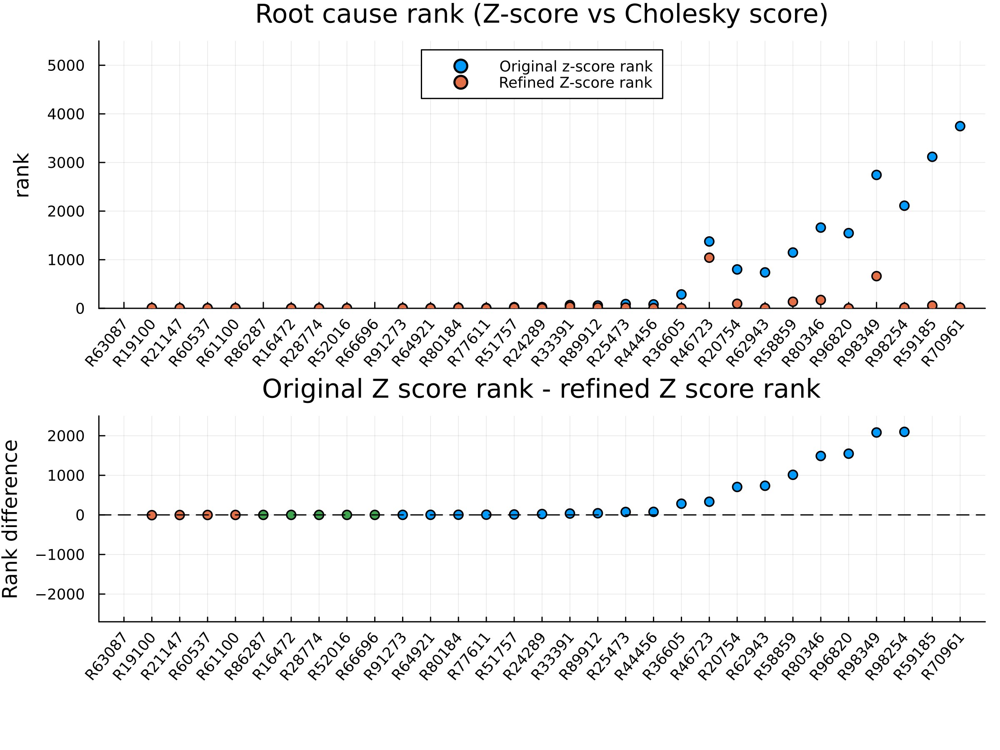

In [10]:
cv_outdir = "/scratch/users/bbchu/RootCauseDiscovery/6.13.2024/cv"
nhalf_outdir = "/scratch/users/bbchu/RootCauseDiscovery/6.13.2024/nhalf"

# run z score method
z = RootCauseDiscovery.zscore(Xobs, Xint) # each row is a patient, each col a gene, df_z[i, j] is a z score
df = DataFrame(
    "Patient Name"=>String[],
    "Original Z-score rank"=>Float64[],
    "Cholesky score rank (CV)"=>Float64[],
    "Cholesky score rank (nhalf)"=>Float64[]
)

# compare our method against z score method
patient_name = ground_truth[!, "Patient ID"]
@showprogress for (i, id) in enumerate(patient_name)
    try
        patient_root_cause_idx = ground_truth[i, "root cause row index in genecounts"]
        patient_root_cause_zscore = z[i, patient_root_cause_idx]
        root_cause_zscore_rank = 
            count(x -> x > patient_root_cause_zscore, @view(z[i, :]))

        # cv result
        jld2_file = joinpath(cv_outdir, "$id.jld2")
        cholesky_score = JLD2.load(jld2_file)["root_cause_score"]
        root_cause_cholesky_score = cholesky_score[patient_root_cause_idx]
        root_cause_chol_rank_cv = count(x -> x > root_cause_cholesky_score, cholesky_score)

        # nhalf result
        jld2_file = joinpath(nhalf_outdir, "$id.jld2")
        cholesky_score = JLD2.load(jld2_file)["root_cause_score"]
        root_cause_cholesky_score = cholesky_score[patient_root_cause_idx]
        root_cause_chol_rank_nhalf = count(x -> x > root_cause_cholesky_score, cholesky_score)
        
        push!(df, [id, root_cause_zscore_rank, root_cause_chol_rank_cv, root_cause_chol_rank_nhalf])
    catch e
        println(e)
        continue
    end
end

# @show length(cholesky_score)
@show df;

# only plot completed patients
patient_name_success = df[!, "Patient Name"]
Z_score_rank = df[!, "Original Z-score rank"]
RCD_rank = df[!, "Cholesky score rank (CV)"]

# make plot
plt = make_plot(Z_score_rank, RCD_rank, patient_name_success;
    plot1_ymax = 5500, plot2_ymin = -2700, plot2_ymax = 2500
)
plot(plt)

### 6.12.2024 (CV and nhalf)

+ low_count = 10
+ threshold = 0.1

Progress: 100%|█████████████████████████████████████████| Time: 0:00:00


df = 32×4 DataFrame
 Row │ Patient Name  Original Z-score rank  Cholesky score rank (CV)  Cholesky score rank (nhalf)
     │ String        Float64                Float64                   Float64
─────┼────────────────────────────────────────────────────────────────────────────────────────────
   1 │ R62943                        739.0                       5.0                          3.0
   2 │ R98254                       2111.0                      14.0                         66.0
   3 │ R86287                      14630.0                   14630.0                      14630.0
   4 │ R89912                         58.0                      15.0                          2.0
   5 │ R19100                          0.0                       1.0                          1.0
   6 │ R15264                          0.0                       0.0                          0.0
   7 │ R36605                        286.0                       2.0                          2.0
   8 │ R61100      

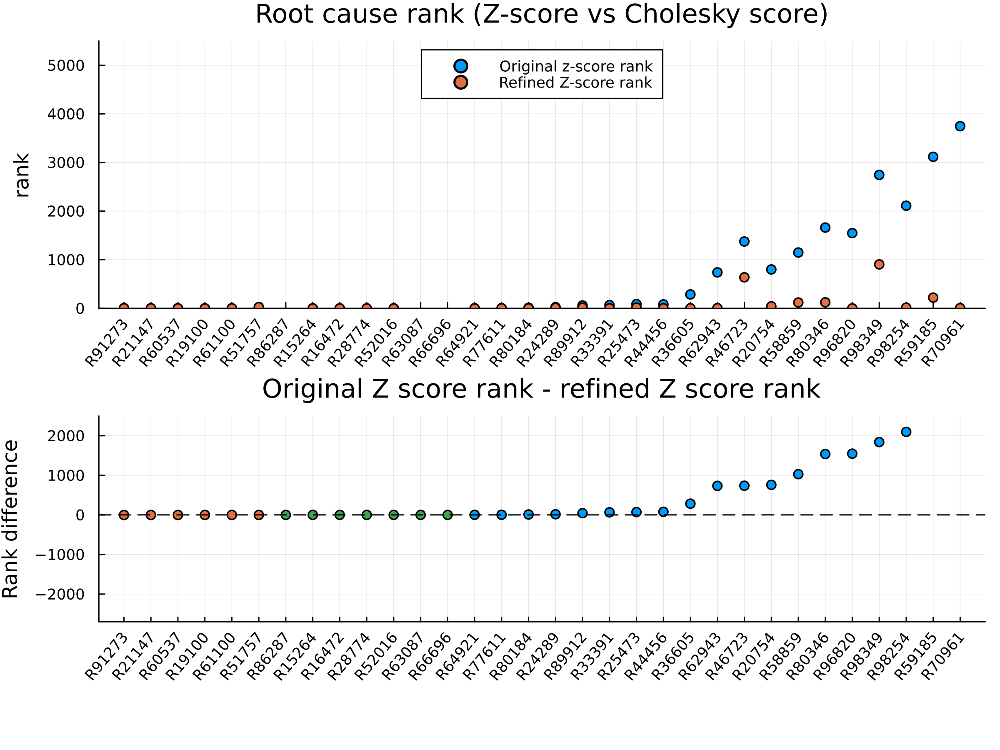

In [9]:
cv_outdir = "/scratch/users/bbchu/RootCauseDiscovery/6.12.2024/cv"
nhalf_outdir = "/scratch/users/bbchu/RootCauseDiscovery/6.12.2024/nhalf"

# run z score method
z = RootCauseDiscovery.zscore(Xobs, Xint) # each row is a patient, each col a gene, df_z[i, j] is a z score
df = DataFrame(
    "Patient Name"=>String[],
    "Original Z-score rank"=>Float64[],
    "Cholesky score rank (CV)"=>Float64[],
    "Cholesky score rank (nhalf)"=>Float64[]
)

# compare our method against z score method
patient_name = ground_truth[!, "Patient ID"]
@showprogress for (i, id) in enumerate(patient_name)
    try
        patient_root_cause_idx = ground_truth[i, "root cause row index in genecounts"]
        patient_root_cause_zscore = z[i, patient_root_cause_idx]
        root_cause_zscore_rank = 
            count(x -> x > patient_root_cause_zscore, @view(z[i, :]))

        # cv result
        jld2_file = joinpath(cv_outdir, "$id.jld2")
        cholesky_score = JLD2.load(jld2_file)["root_cause_score"]
        root_cause_cholesky_score = cholesky_score[patient_root_cause_idx]
        root_cause_chol_rank_cv = count(x -> x > root_cause_cholesky_score, cholesky_score)

        # nhalf result
        jld2_file = joinpath(nhalf_outdir, "$id.jld2")
        cholesky_score = JLD2.load(jld2_file)["root_cause_score"]
        root_cause_cholesky_score = cholesky_score[patient_root_cause_idx]
        root_cause_chol_rank_nhalf = count(x -> x > root_cause_cholesky_score, cholesky_score)
        
        push!(df, [id, root_cause_zscore_rank, root_cause_chol_rank_cv, root_cause_chol_rank_nhalf])
    catch e
        println(e)
        continue
    end
end

# @show length(cholesky_score)
@show df;

# only plot completed patients
patient_name_success = df[!, "Patient Name"]
Z_score_rank = df[!, "Original Z-score rank"]
RCD_rank = df[!, "Cholesky score rank (CV)"]

# make plot
plt = make_plot(Z_score_rank, RCD_rank, patient_name_success;
    plot1_ymax = 5500, plot2_ymin = -2700, plot2_ymax = 2500
)
plot(plt)

### 6.11.2024 (CV, note: this uses the 5182024 seed) 

+ low_count = 10
+ threshold = 0.1

Progress:  38%|███████████████▍                         |  ETA: 0:00:20

ArgumentError(

Progress:  41%|████████████████▋                        |  ETA: 0:00:19

"No file exists at given path: /scratch/users/bbchu/RootCauseDiscovery/6.11.2024/cv/R20754.jld2")


Progress: 100%|█████████████████████████████████████████| Time: 0:00:31


df = 31×3 DataFrame
 Row │ Patient Name  Original Z-score rank  Cholesky score rank
     │ String        Float64                Float64
─────┼──────────────────────────────────────────────────────────
   1 │ R62943                        739.0                  5.0
   2 │ R98254                       2111.0                 28.0
   3 │ R86287                      14630.0              14630.0
   4 │ R89912                         58.0                 18.0
   5 │ R19100                          0.0                 12.0
   6 │ R15264                          0.0                  3.0
   7 │ R36605                        286.0                 15.0
   8 │ R61100                          1.0                  2.0
   9 │ R77611                          5.0                  0.0
  10 │ R16472                          0.0                  4.0
  11 │ R51757                         24.0                 26.0
  12 │ R80346                       1661.0                 45.0
  13 │ R25473                  

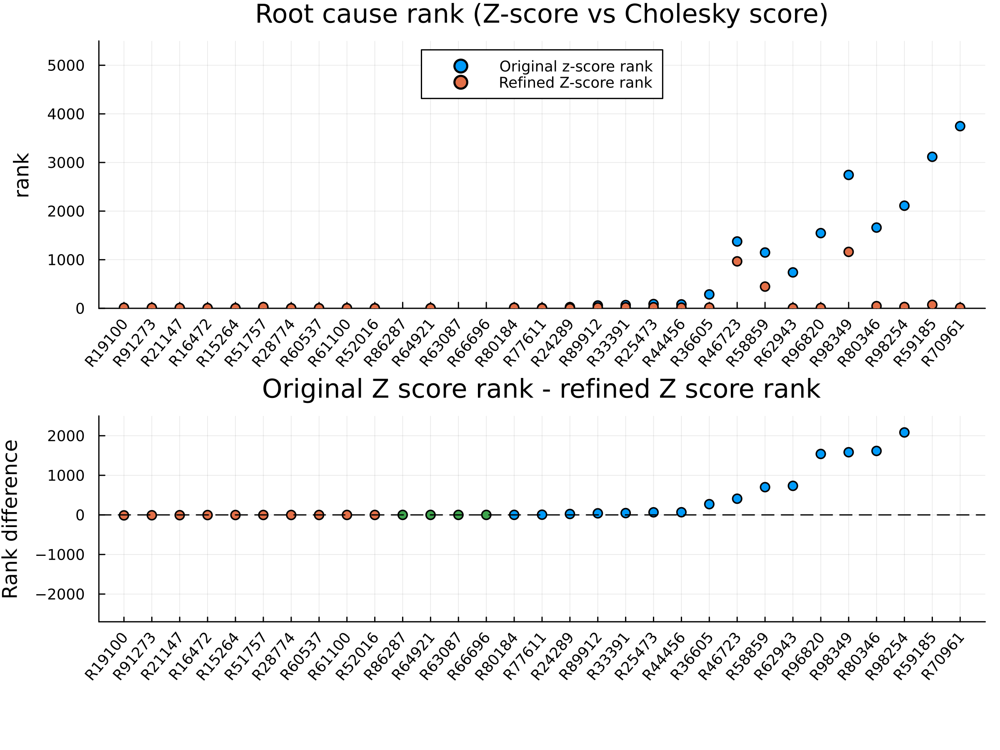

In [9]:
outdir = "/scratch/users/bbchu/RootCauseDiscovery/6.11.2024/cv"

# run z score method
z = RootCauseDiscovery.zscore(Xobs, Xint) # each row is a patient, each col a gene, df_z[i, j] is a z score

# compare our method against z score method
df = DataFrame(
    "Patient Name"=>String[],
    "Original Z-score rank"=>Float64[],
    "Cholesky score rank"=>Float64[]
)
patient_name = ground_truth[!, "Patient ID"]
@showprogress for (i, id) in enumerate(patient_name)
    try
        patient_root_cause_idx = ground_truth[i, "root cause row index in genecounts"]
        patient_root_cause_zscore = z[i, patient_root_cause_idx]
        root_cause_zscore_rank = 
            count(x -> x > patient_root_cause_zscore, @view(z[i, :]))

        # root cause discovery
        jld2_file = joinpath(outdir, "$id.jld2")
        cholesky_score = JLD2.load(jld2_file)["root_cause_score"]
        root_cause_cholesky_score = cholesky_score[patient_root_cause_idx]
        root_cause_chol_rank = count(x -> x > root_cause_cholesky_score, cholesky_score)
        push!(df, [id, root_cause_zscore_rank, root_cause_chol_rank])
        GC.gc();GC.gc();GC.gc();
    catch e
        println(e)
        continue
    end
end

# @show length(cholesky_score)
@show df;

# only plot completed patients
patient_name_success = df[!, "Patient Name"]
Z_score_rank = df[!, "Original Z-score rank"]
RCD_rank = df[!, "Cholesky score rank"]

# make plot
plt = make_plot(Z_score_rank, RCD_rank, patient_name_success;
    plot1_ymax = 5500, plot2_ymin = -2700, plot2_ymax = 2500
)
plot(plt)

### 6.10.2024 (CV)

+ low_count = 10
+ threshold = 0.1

Progress: 100%|█████████████████████████████████████████| Time: 0:00:27


df = 32×3 DataFrame
 Row │ Patient Name  Original Z-score rank  Cholesky score rank
     │ String        Float64                Float64
─────┼──────────────────────────────────────────────────────────
   1 │ R62943                        739.0                  7.0
   2 │ R98254                       2111.0                 27.0
   3 │ R86287                      14630.0              14630.0
   4 │ R89912                         58.0                 18.0
   5 │ R19100                          0.0                 13.0
   6 │ R15264                          0.0                  4.0
   7 │ R36605                        286.0                  9.0
   8 │ R61100                          1.0                  4.0
   9 │ R77611                          5.0                  1.0
  10 │ R16472                          0.0                  4.0
  11 │ R51757                         24.0                 23.0
  12 │ R80346                       1661.0                 60.0
  13 │ R20754                  

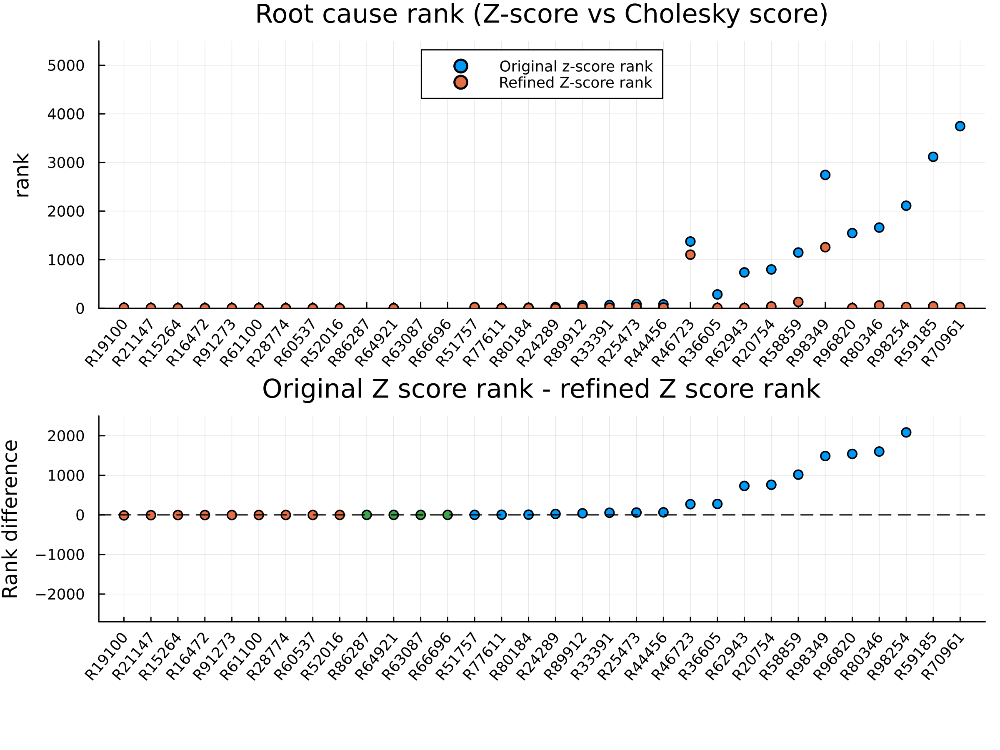

In [7]:
outdir = "/scratch/users/bbchu/RootCauseDiscovery/6.10.2024/cv"

# run z score method
z = RootCauseDiscovery.zscore(Xobs, Xint) # each row is a patient, each col a gene, df_z[i, j] is a z score

# compare our method against z score method
df = DataFrame(
    "Patient Name"=>String[],
    "Original Z-score rank"=>Float64[],
    "Cholesky score rank"=>Float64[]
)
patient_name = ground_truth[!, "Patient ID"]
@showprogress for (i, id) in enumerate(patient_name)
    try
        patient_root_cause_idx = ground_truth[i, "root cause row index in genecounts"]
        patient_root_cause_zscore = z[i, patient_root_cause_idx]
        root_cause_zscore_rank = 
            count(x -> x > patient_root_cause_zscore, @view(z[i, :]))

        # root cause discovery
        jld2_file = joinpath(outdir, "$id.jld2")
        cholesky_score = JLD2.load(jld2_file)["root_cause_score"]
        root_cause_cholesky_score = cholesky_score[patient_root_cause_idx]
        root_cause_chol_rank = count(x -> x > root_cause_cholesky_score, cholesky_score)
        push!(df, [id, root_cause_zscore_rank, root_cause_chol_rank])
        GC.gc();GC.gc();GC.gc();
    catch e
        println(e)
        continue
    end
end

# @show length(cholesky_score)
@show df;

# only plot completed patients
patient_name_success = df[!, "Patient Name"]
Z_score_rank = df[!, "Original Z-score rank"]
RCD_rank = df[!, "Cholesky score rank"]

# make plot
plt = make_plot(Z_score_rank, RCD_rank, patient_name_success;
    plot1_ymax = 5500, plot2_ymin = -2700, plot2_ymax = 2500
)
plot(plt)

### 6.9.2024 (CV)

+ low_count = 10
+ threshold = 0.1

Progress: 100%|█████████████████████████████████████████| Time: 0:00:30


df = 32×3 DataFrame
 Row │ Patient Name  Original Z-score rank  Cholesky score rank
     │ String        Float64                Float64
─────┼──────────────────────────────────────────────────────────
   1 │ R62943                        739.0                  5.0
   2 │ R98254                       2111.0                 30.0
   3 │ R86287                      14630.0              14630.0
   4 │ R89912                         58.0                 10.0
   5 │ R19100                          0.0                 13.0
   6 │ R15264                          0.0                  3.0
   7 │ R36605                        286.0                  6.0
   8 │ R61100                          1.0                  2.0
   9 │ R77611                          5.0                  0.0
  10 │ R16472                          0.0                  4.0
  11 │ R51757                         24.0                 29.0
  12 │ R80346                       1661.0                 89.0
  13 │ R20754                  

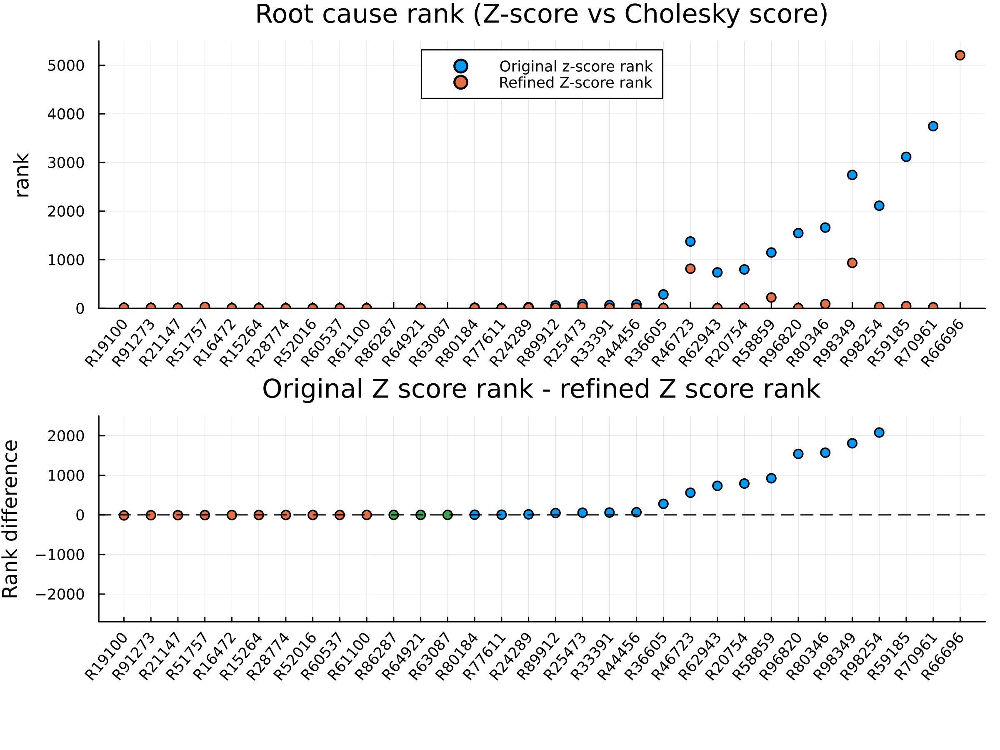

In [5]:
outdir = "/scratch/users/bbchu/RootCauseDiscovery/6.9.2024/cv"

# run z score method
z = RootCauseDiscovery.zscore(Xobs, Xint) # each row is a patient, each col a gene, df_z[i, j] is a z score

# compare our method against z score method
df = DataFrame(
    "Patient Name"=>String[],
    "Original Z-score rank"=>Float64[],
    "Cholesky score rank"=>Float64[]
)
patient_name = ground_truth[!, "Patient ID"]
@showprogress for (i, id) in enumerate(patient_name)
    try
        patient_root_cause_idx = ground_truth[i, "root cause row index in genecounts"]
        patient_root_cause_zscore = z[i, patient_root_cause_idx]
        root_cause_zscore_rank = 
            count(x -> x > patient_root_cause_zscore, @view(z[i, :]))

        # root cause discovery
        jld2_file = joinpath(outdir, "$id.jld2")
        cholesky_score = JLD2.load(jld2_file)["root_cause_score"]
        root_cause_cholesky_score = cholesky_score[patient_root_cause_idx]
        root_cause_chol_rank = count(x -> x > root_cause_cholesky_score, cholesky_score)
        push!(df, [id, root_cause_zscore_rank, root_cause_chol_rank])
        GC.gc();GC.gc();GC.gc();
    catch e
        println(e)
        continue
    end
end

# @show length(cholesky_score)
@show df;

# only plot completed patients
patient_name_success = df[!, "Patient Name"]
Z_score_rank = df[!, "Original Z-score rank"]
RCD_rank = df[!, "Cholesky score rank"]

# make plot
plt = make_plot(Z_score_rank, RCD_rank, patient_name_success;
    plot1_ymax = 5500, plot2_ymin = -2700, plot2_ymax = 2500
)
plot(plt)

### 6.8.2024 (CV)

+ low_count = 10
+ threshold = 0.1

Progress: 100%|█████████████████████████████████████████| Time: 0:00:31


df = 32×3 DataFrame
 Row │ Patient Name  Original Z-score rank  Cholesky score rank
     │ String        Float64                Float64
─────┼──────────────────────────────────────────────────────────
   1 │ R62943                        739.0                  5.0
   2 │ R98254                       2111.0                 29.0
   3 │ R86287                      14630.0              14630.0
   4 │ R89912                         58.0                 15.0
   5 │ R19100                          0.0                 12.0
   6 │ R15264                          0.0                  4.0
   7 │ R36605                        286.0                  7.0
   8 │ R61100                          1.0                  3.0
   9 │ R77611                          5.0                  3.0
  10 │ R16472                          0.0                  4.0
  11 │ R51757                         24.0                 18.0
  12 │ R80346                       1661.0                 57.0
  13 │ R20754                  

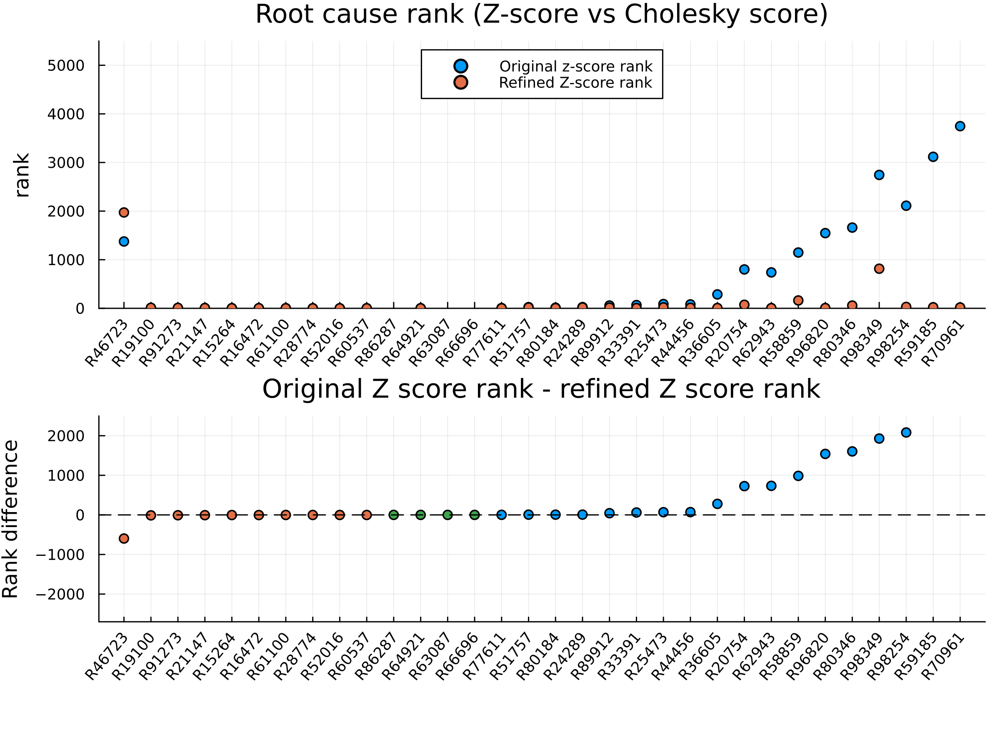

In [3]:
outdir = "/scratch/users/bbchu/RootCauseDiscovery/6.8.2024/cv"

# run z score method
z = RootCauseDiscovery.zscore(Xobs, Xint) # each row is a patient, each col a gene, df_z[i, j] is a z score

# compare our method against z score method
df = DataFrame(
    "Patient Name"=>String[],
    "Original Z-score rank"=>Float64[],
    "Cholesky score rank"=>Float64[]
)
patient_name = ground_truth[!, "Patient ID"]
@showprogress for (i, id) in enumerate(patient_name)
    try
        patient_root_cause_idx = ground_truth[i, "root cause row index in genecounts"]
        patient_root_cause_zscore = z[i, patient_root_cause_idx]
        root_cause_zscore_rank = 
            count(x -> x > patient_root_cause_zscore, @view(z[i, :]))

        # root cause discovery
        jld2_file = joinpath(outdir, "$id.jld2")
        cholesky_score = JLD2.load(jld2_file)["root_cause_score"]
        root_cause_cholesky_score = cholesky_score[patient_root_cause_idx]
        root_cause_chol_rank = count(x -> x > root_cause_cholesky_score, cholesky_score)
        push!(df, [id, root_cause_zscore_rank, root_cause_chol_rank])
        GC.gc();GC.gc();GC.gc();
    catch e
        println(e)
        continue
    end
end

# @show length(cholesky_score)
@show df;

# only plot completed patients
patient_name_success = df[!, "Patient Name"]
Z_score_rank = df[!, "Original Z-score rank"]
RCD_rank = df[!, "Cholesky score rank"]

# make plot
plt = make_plot(Z_score_rank, RCD_rank, patient_name_success;
    plot1_ymax = 5500, plot2_ymin = -2700, plot2_ymax = 2500
)
plot(plt)

### 5.20.2024 (CV)

+ low_count = 5
+ threshold = 0.1

Progress:  31%|████████████▊                            |  ETA: 0:00:18

ArgumentError("No file exists at given path: /scratch/users/bbchu/RootCauseDiscovery/5.20.2024/cv_old/R51757.jld2")
ArgumentError("No file exists at given path: /scratch/users/bbchu/RootCauseDiscovery/5.20.2024/cv_old/R52016.jld2")


Progress:  88%|███████████████████████████████████▉     |  ETA: 0:00:03

ArgumentError("No file exists at given path: /scratch/users/bbchu/RootCauseDiscovery/5.20.2024/cv_old/R98349.jld2")
ArgumentError("No file exists at given path: /scratch/users/bbchu/RootCauseDiscovery/5.20.2024/cv_old/R60537.jld2")


Progress: 100%|█████████████████████████████████████████| Time: 0:00:22


df = 28×3 DataFrame
 Row │ Patient Name  Original Z-score rank  Cholesky score rank
     │ String        Float64                Float64
─────┼──────────────────────────────────────────────────────────
   1 │ R62943                        890.0                  0.0
   2 │ R98254                       2692.0                 62.0
   3 │ R86287                      16300.0              16300.0
   4 │ R89912                         90.0                 45.0
   5 │ R19100                          0.0                  0.0
   6 │ R15264                          0.0                  0.0
   7 │ R36605                        346.0                 17.0
   8 │ R61100                          4.0                  0.0
   9 │ R77611                         11.0                  1.0
  10 │ R16472                          0.0                  0.0
  11 │ R80346                       2057.0                 87.0
  12 │ R20754                        874.0                 29.0
  13 │ R25473                  

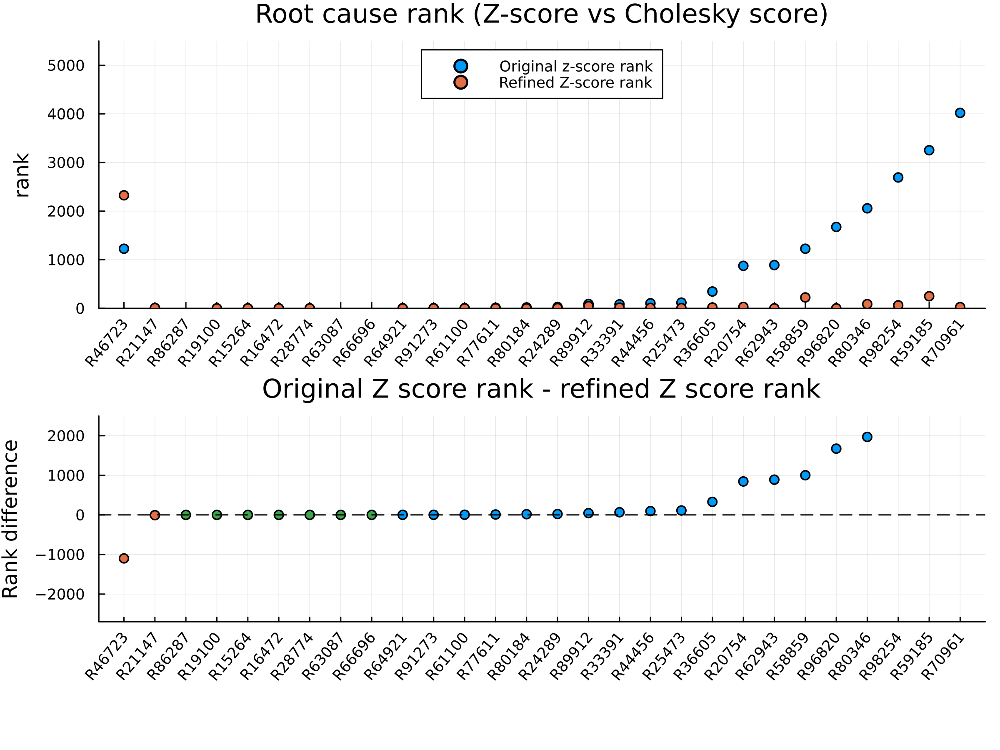

In [12]:
outdir = "/scratch/users/bbchu/RootCauseDiscovery/5.20.2024/cv"

# run z score method
z = RootCauseDiscovery.zscore(Xobs, Xint) # each row is a patient, each col a gene, df_z[i, j] is a z score

# compare our method against z score method
df = DataFrame(
    "Patient Name"=>String[],
    "Original Z-score rank"=>Float64[],
    "Cholesky score rank"=>Float64[]
)
patient_name = ground_truth[!, "Patient ID"]
@showprogress for (i, id) in enumerate(patient_name)
    try
        patient_root_cause_idx = ground_truth[i, "root cause row index in genecounts"]
        patient_root_cause_zscore = z[i, patient_root_cause_idx]
        root_cause_zscore_rank = 
            count(x -> x > patient_root_cause_zscore, @view(z[i, :]))

        # root cause discovery
        jld2_file = joinpath(outdir, "$id.jld2")
        cholesky_score = JLD2.load(jld2_file)["root_cause_score"]
        root_cause_cholesky_score = cholesky_score[patient_root_cause_idx]
        root_cause_chol_rank = count(x -> x > root_cause_cholesky_score, cholesky_score)
        push!(df, [id, root_cause_zscore_rank, root_cause_chol_rank])
        GC.gc();GC.gc();GC.gc();
    catch e
        println(e)
        continue
    end
end

# @show length(cholesky_score)
@show df;

# only plot completed patients
patient_name_success = df[!, "Patient Name"]
Z_score_rank = df[!, "Original Z-score rank"]
RCD_rank = df[!, "Cholesky score rank"]

# make plot
plt = make_plot(Z_score_rank, RCD_rank, patient_name_success;
    plot1_ymax = 5500, plot2_ymin = -2700, plot2_ymax = 2500
)
plot(plt)

### 5.20.2024 (largest support)

+ low_count = 5
+ threshold = 0.1

In [7]:
outdir = "/scratch/users/bbchu/RootCauseDiscovery/5.20.2024/largest_support"
max_acceptable_zscore = 1.5

# run z score method
z = RootCauseDiscovery.zscore(Xobs, Xint) # each row is a patient, each col a gene, df_z[i, j] is a z score

# compare our method against z score method
df = DataFrame(
    "Patient Name"=>String[],
    "Original Z-score rank"=>Float64[],
    "Refined Z-score rank"=>Float64[]
)
patient_name = ground_truth[!, "Patient ID"]
@showprogress for (i, id) in enumerate(patient_name)
    try
        patient_root_cause_idx = ground_truth[i, "root cause row index in genecounts"]
        patient_root_cause_zscore = z[i, patient_root_cause_idx]
        patient_root_cause_rank = 
            count(x -> x > patient_root_cause_zscore, @view(z[i, :]))

        # root cause discovery
        jld2_file = joinpath(outdir, "$id.jld2")
        rk = cholesky_score_rank(
            jld2_file, id, ground_truth, Xobs, Xint, 
            max_acceptable_zscore = max_acceptable_zscore, verbose=false
        )
        push!(df, [id, patient_root_cause_rank, rk])
        GC.gc();GC.gc();GC.gc();
    catch e
        println(e)
        continue
    end
end

@show df;

Progress:  16%|██████▍                                  |  ETA: 0:02:25

ArgumentError(

Progress:  19%|███████▊                                 |  ETA: 0:02:01

"No file exists at given path: /scratch/users/bbchu/RootCauseDiscovery/5.20.2024/largest_support/R15264.jld2")


Progress:  59%|████████████████████████▍                |  ETA: 0:01:08

Root cause did not match


Progress: 100%|█████████████████████████████████████████| Time: 0:03:02


df = 31×3 DataFrame
 Row │ Patient Name  Original Z-score rank  Refined Z-score rank
     │ String        Float64                Float64
─────┼───────────────────────────────────────────────────────────
   1 │ R62943                        890.0                  29.0
   2 │ R98254                       2692.0                 535.0
   3 │ R86287                      16300.0                 Inf
   4 │ R89912                         90.0                  14.0
   5 │ R19100                          0.0                   6.0
   6 │ R36605                        346.0                  14.0
   7 │ R61100                          4.0                   3.0
   8 │ R77611                         11.0                  18.0
   9 │ R16472                          0.0                   2.0
  10 │ R51757                         28.0                   5.0
  11 │ R80346                       2057.0                 383.0
  12 │ R20754                        874.0                  18.0
  13 │ R25473      

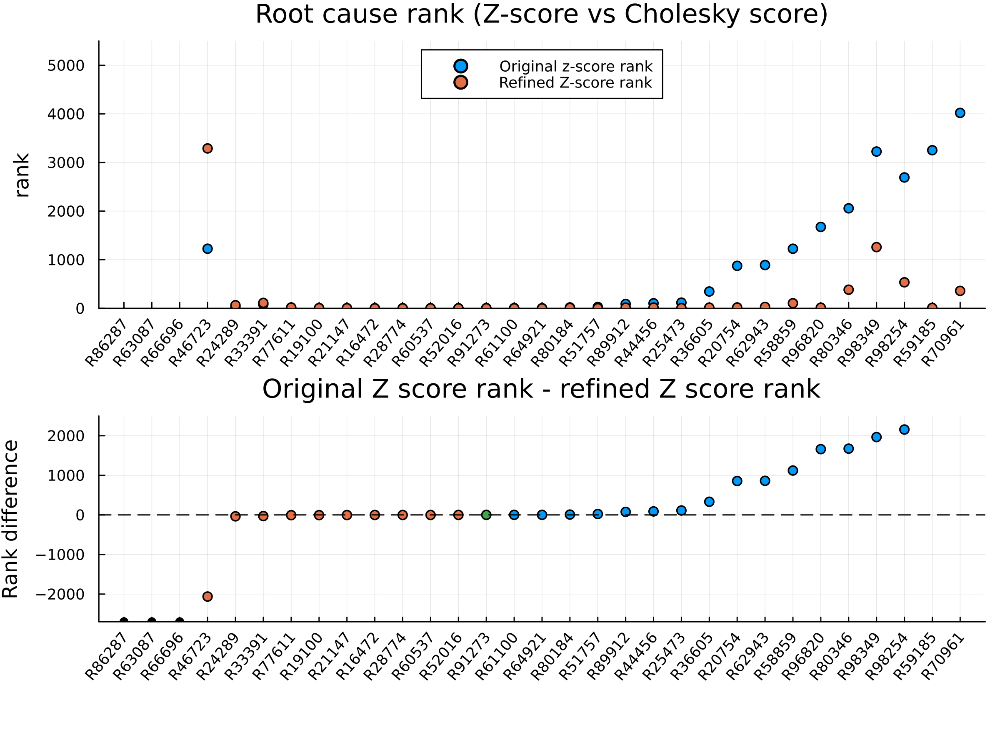

In [8]:
# only plot completed patients
patient_name_success = df[!, "Patient Name"]
Z_score_rank = df[!, "Original Z-score rank"]
RCD_rank = df[!, "Refined Z-score rank"]

# make plot
plt = make_plot(Z_score_rank, RCD_rank, patient_name_success;
    plot1_ymax = 5500, plot2_ymin = -2700, plot2_ymax = 2500
)
plot(plt)

### 5.19.2024 (CV)

+ low_count = 5
+ threshold = 0.05

Progress:   6%|██▌                                      |  ETA: 0:00:31

ArgumentError("No file exists at given path: /scratch/users/bbchu/RootCauseDiscovery/5.19.2024/cv/R86287.jld2")
ArgumentError("No file exists at given path: /scratch/users/bbchu/RootCauseDiscovery/5.19.2024/cv/R36605.jld2")
ArgumentError("No file exists at given path: /scratch/users/bbchu/RootCauseDiscovery/5.19.2024/cv/R16472.jld2")
ArgumentError("No file exists at given path: /scratch/users/bbchu/RootCauseDiscovery/5.19.2024/cv/R51757.jld2")


Progress:  41%|████████████████▋                        |  ETA: 0:00:14

ArgumentError("No file exists at given path: /scratch/users/bbchu/RootCauseDiscovery/5.19.2024/cv/R25473.jld2")
ArgumentError("No file exists at given path: /scratch/users/bbchu/RootCauseDiscovery/5.19.2024/cv/R96820.jld2")


Progress:  72%|█████████████████████████████▌           |  ETA: 0:00:07

ArgumentError("No file exists at given path: /scratch/users/bbchu/RootCauseDiscovery/5.19.2024/cv/R59185.jld2")


Progress:  78%|████████████████████████████████         |  ETA: 0:00:06

ArgumentError("No file exists at given path: /scratch/users/bbchu/RootCauseDiscovery/5.19.2024/cv/R33391.jld2")
ArgumentError("No file exists at given path: /scratch/users/bbchu/RootCauseDiscovery/5.19.2024/cv/R98349.jld2")


Progress: 100%|█████████████████████████████████████████| Time: 0:00:25


length(cholesky_score) = 22873
df = 23×3 DataFrame
 Row │ Patient Name  Original Z-score rank  Cholesky score rank
     │ String        Float64                Float64
─────┼──────────────────────────────────────────────────────────
   1 │ R62943                        985.0                  0.0
   2 │ R98254                       2948.0                135.0
   3 │ R89912                        107.0                 58.0
   4 │ R19100                          0.0                  0.0
   5 │ R15264                          0.0                  0.0
   6 │ R61100                          5.0                  0.0
   7 │ R77611                         13.0                  0.0
   8 │ R80346                       2363.0                398.0
   9 │ R20754                        938.0                 18.0
  10 │ R28774                          0.0                  0.0
  11 │ R21147                          0.0                  4.0
  12 │ R64921                          2.0                  0.0


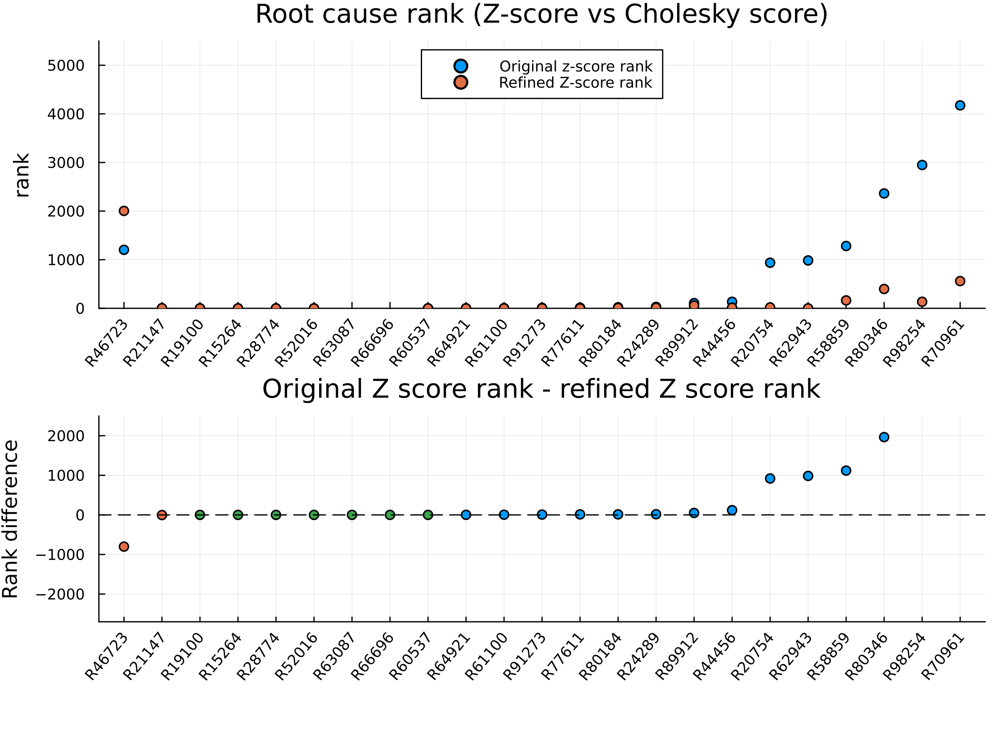

In [28]:
outdir = "/scratch/users/bbchu/RootCauseDiscovery/5.19.2024/cv"

# run z score method
z = RootCauseDiscovery.zscore(Xobs, Xint) # each row is a patient, each col a gene, df_z[i, j] is a z score

# compare our method against z score method
df = DataFrame(
    "Patient Name"=>String[],
    "Original Z-score rank"=>Float64[],
    "Cholesky score rank"=>Float64[]
)
patient_name = ground_truth[!, "Patient ID"]
@showprogress for (i, id) in enumerate(patient_name)
    try
        patient_root_cause_idx = ground_truth[i, "root cause row index in genecounts"]
        patient_root_cause_zscore = z[i, patient_root_cause_idx]
        root_cause_zscore_rank = 
            count(x -> x > patient_root_cause_zscore, @view(z[i, :]))

        # root cause discovery
        jld2_file = joinpath(outdir, "$id.jld2")
        cholesky_score = JLD2.load(jld2_file)["root_cause_score"]
        root_cause_cholesky_score = cholesky_score[patient_root_cause_idx]
        root_cause_chol_rank = count(x -> x > root_cause_cholesky_score, cholesky_score)
        push!(df, [id, root_cause_zscore_rank, root_cause_chol_rank])
        GC.gc();GC.gc();GC.gc();
    catch e
        println(e)
        continue
    end
end

@show length(cholesky_score)
@show df;

# only plot completed patients
patient_name_success = df[!, "Patient Name"]
Z_score_rank = df[!, "Original Z-score rank"]
RCD_rank = df[!, "Cholesky score rank"]

# make plot
plt = make_plot(Z_score_rank, RCD_rank, patient_name_success;
    plot1_ymax = 5500, plot2_ymin = -2700, plot2_ymax = 2500
)
plot(plt)

### 5.18.2024 (CV)

+ low_count = 10
+ threshold = 0.1

Progress:  62%|█████████████████████████▋               |  ETA: 0:00:11

ArgumentError("No file exists at given path: /scratch/users/bbchu/RootCauseDiscovery/5.18.2024/cv/R58859.jld2")


Progress: 100%|█████████████████████████████████████████| Time: 0:00:28


length(cholesky_score) = 19831
df = 31×3 DataFrame
 Row │ Patient Name  Original Z-score rank  Cholesky score rank
     │ String        Float64                Float64
─────┼──────────────────────────────────────────────────────────
   1 │ R62943                        739.0                  1.0
   2 │ R98254                       2111.0                 14.0
   3 │ R86287                      14630.0              14630.0
   4 │ R89912                         58.0                 11.0
   5 │ R19100                          0.0                  0.0
   6 │ R15264                          0.0                  0.0
   7 │ R36605                        286.0                  6.0
   8 │ R61100                          1.0                  0.0
   9 │ R77611                          5.0                  0.0
  10 │ R16472                          0.0                  0.0
  11 │ R51757                         24.0                 21.0
  12 │ R80346                       1661.0                 29.0


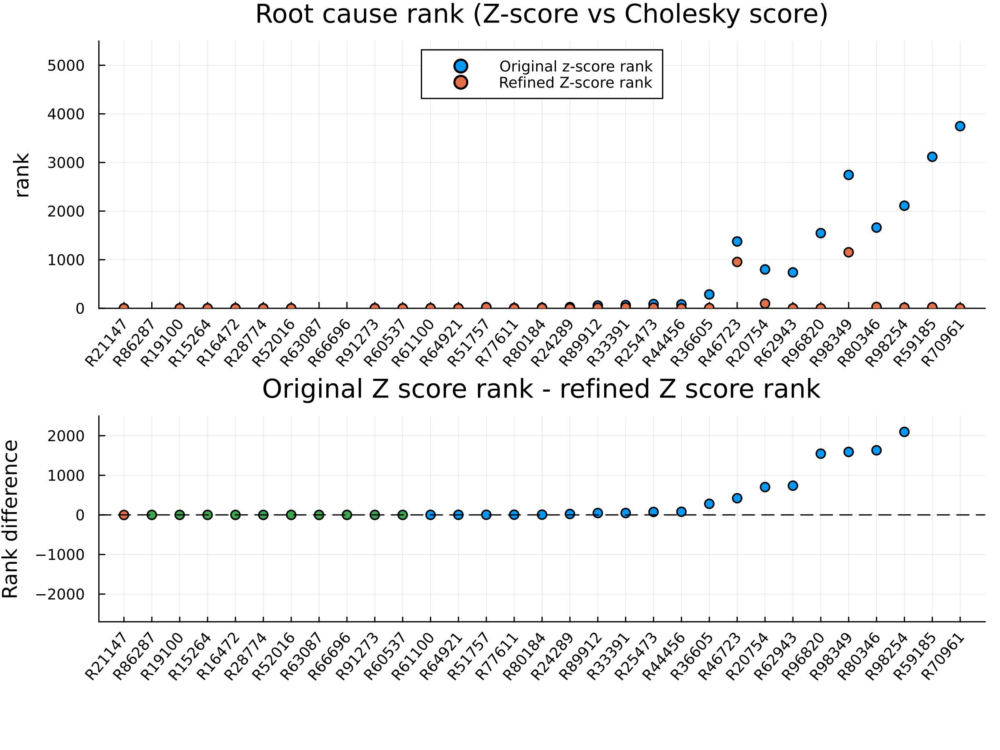

In [33]:
outdir = "/scratch/users/bbchu/RootCauseDiscovery/5.18.2024/cv"

# run z score method
z = RootCauseDiscovery.zscore(Xobs, Xint) # each row is a patient, each col a gene, df_z[i, j] is a z score

# compare our method against z score method
df = DataFrame(
    "Patient Name"=>String[],
    "Original Z-score rank"=>Float64[],
    "Cholesky score rank"=>Float64[]
)
patient_name = ground_truth[!, "Patient ID"]
@showprogress for (i, id) in enumerate(patient_name)
    try
        patient_root_cause_idx = ground_truth[i, "root cause row index in genecounts"]
        patient_root_cause_zscore = z[i, patient_root_cause_idx]
        root_cause_zscore_rank = 
            count(x -> x > patient_root_cause_zscore, @view(z[i, :]))

        # root cause discovery
        jld2_file = joinpath(outdir, "$id.jld2")
        cholesky_score = JLD2.load(jld2_file)["root_cause_score"]
        root_cause_cholesky_score = cholesky_score[patient_root_cause_idx]
        root_cause_chol_rank = count(x -> x > root_cause_cholesky_score, cholesky_score)
        push!(df, [id, root_cause_zscore_rank, root_cause_chol_rank])
        GC.gc();GC.gc();GC.gc();
    catch e
        println(e)
        continue
    end
end

@show length(cholesky_score)
@show df;

# only plot completed patients
patient_name_success = df[!, "Patient Name"]
Z_score_rank = df[!, "Original Z-score rank"]
RCD_rank = df[!, "Cholesky score rank"]

# make plot
plt = make_plot(Z_score_rank, RCD_rank, patient_name_success;
    plot1_ymax = 5500, plot2_ymin = -2700, plot2_ymax = 2500
)
plot(plt)

### 5.11.2024 (CV)

+ low_count = 10
+ threshold = 0.05

In [19]:
outdir = "/scratch/users/bbchu/RootCauseDiscovery/5.11.2024/cv"

# run z score method
z = RootCauseDiscovery.zscore(Xobs, Xint) # each row is a patient, each col a gene, df_z[i, j] is a z score

# compare our method against z score method
df = DataFrame(
    "Patient Name"=>String[],
    "Original Z-score rank"=>Float64[],
    "Cholesky score rank"=>Float64[]
)
patient_name = ground_truth[!, "Patient ID"]
@showprogress for (i, id) in enumerate(patient_name)
    try
        patient_root_cause_idx = ground_truth[i, "root cause row index in genecounts"]
        patient_root_cause_zscore = z[i, patient_root_cause_idx]
        root_cause_zscore_rank = 
            count(x -> x > patient_root_cause_zscore, @view(z[i, :]))

        # root cause discovery
        jld2_file = joinpath(outdir, "$id.jld2")
        cholesky_score = JLD2.load(jld2_file)["root_cause_score"]
        root_cause_cholesky_score = cholesky_score[patient_root_cause_idx]
        root_cause_chol_rank = count(x -> x > root_cause_cholesky_score, cholesky_score)
        push!(df, [id, root_cause_zscore_rank, root_cause_chol_rank])
        GC.gc();GC.gc();GC.gc();
    catch e
        println(e)
        continue
    end
end

@show df;

ArgumentError("No file exists at given path: /scratch/users/bbchu/RootCauseDiscovery/5.11.2024/cv/R62943.jld2")


Progress: 100%|█████████████████████████████████████████| Time: 0:00:32


df = 31×3 DataFrame
 Row │ Patient Name  Original Z-score rank  Cholesky score rank
     │ String        Float64                Float64
─────┼──────────────────────────────────────────────────────────
   1 │ R98254                       2299.0                  9.0
   2 │ R86287                      15417.0              15417.0
   3 │ R89912                         72.0                 30.0
   4 │ R19100                          0.0                  0.0
   5 │ R15264                          0.0                  0.0
   6 │ R36605                        306.0                 13.0
   7 │ R61100                          2.0                  0.0
   8 │ R77611                          8.0                  1.0
   9 │ R16472                          0.0                  0.0
  10 │ R51757                         26.0                 21.0
  11 │ R80346                       1873.0                121.0
  12 │ R20754                        842.0                  9.0
  13 │ R25473                  

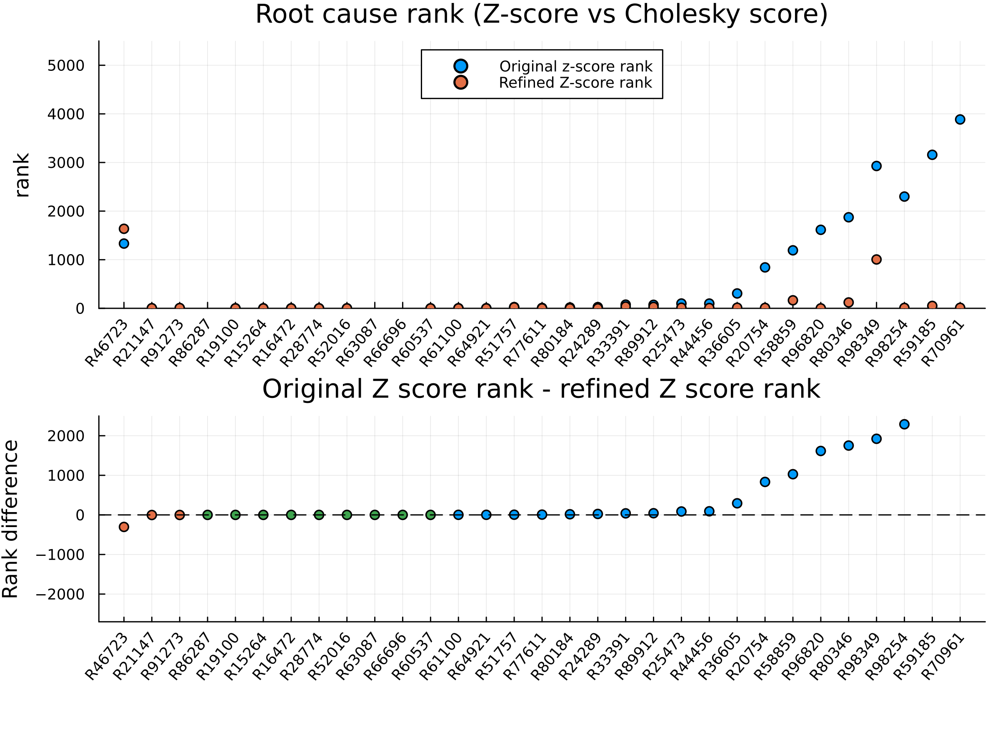

In [21]:
# only plot completed patients
patient_name_success = df[!, "Patient Name"]
Z_score_rank = df[!, "Original Z-score rank"]
RCD_rank = df[!, "Cholesky score rank"]

# make plot
plt = make_plot(Z_score_rank, RCD_rank, patient_name_success;
    plot1_ymax = 5500, plot2_ymin = -2700, plot2_ymax = 2500
)
plot(plt)